# Interpretable Machine Learning with Python
## **Exercise**: _What qualities make for a highly rated chocolate bar?_

### The Mission

Who doesn't love chocolate?! It's a global favorite with around nine out of ten people loving it and about a billion people eating it every day. One popular form it is consumed as is as a chocolate bar. However, even universally beloved ingredients can be used in ways that aren't universally appealing. Often this is solely determined by the quality of the cocoa or additional ingredients, and, sometimes, it becomes an acquired taste once it's combined with exotic flavors.

Members of the [Manhattan Chocolate Society](http://flavorsofcacao.com/mcs_index.html) have been meeting since $2007$ for the sole purpose of tasting and judging fine chocolate to educate consumers and inspire chocolate makers to produce higher quality chocolate. Since then, they have compiled a dataset of over $2,200$ chocolate bars from all over the world  rated by their members. This rating is derived from a rubric that factors in aroma, appearance, texture, flavor, aftertaste, and overall opinion. And bars rated are mostly darker chocolate bars since the aim is appreciating the flavors of cacao. In addition to the rating, the Manhattan Chocolate Society dataset includes many characteristics such as the country where the cocoa bean was farmed, how many ingredients the bar has, if it includes salt or not, and the words used to describe it. 

- A chocolate manufacturer who will remain unnamed is obsessed with excellence, and has reached out to you!
- Over 80% of their bars are highly rated everywhere but a handful of them are consistently not. 
- Sales are bad for some of them too which suggests that not only critics are turned off but also general public.
- They have conducted some market research for these bars without conclusive results. People seem to like them in focus groups regardless of expert opinions which contradicts their theory.
- The Manhattan Chocolate Society data could be useful because it’s not from professional experts/critics but knowledgeable lovers of chocolate. This could be very useful because this more closely resembles their target demographic.
- They have asked you to produce models with that data and compare one of their “Outstanding” bars with a “Disappointing” one through your models' lens.


### The Approach

- **Train Two Classification Models**: a Support Vector Machines model on the tabular data and an NLP LightGBM model on solely words used to describe the chocolate bars.
- **Global Model Interpretation with SHAP (tabular)**: Even though the point of this exercise is local model interpretation, it's important to start with global to make sure outcomes are intuitive. If they aren't, perhaps something is amiss.
- **Local Model Interpretation with SHAP (tabular)**: Examine decision-making a bit with decision plots and then, look at the two chocolate bars the Chocolatier wants you to compare. 
- **Local Model Interpretation with LIME (tabular)**: Continue the analysis of the two chocolate bars.
- **Local Model Interpretation with LIME (NLP)**: How do the model decisions based on words compare with the tabular interpretations?
- **BONUS!**: let's now try to have some fun with arbitrary phrases and attempt to make SHAP work with the NLP model as well to compare.

## 1) Install Libraries
#### _(if not installed already)_

In [ ]:
# !pip install --upgrade --quiet shap lime
# !pip install lightgbm

## 2) Load Libraries

In [2]:
#DATA WRANGLING
import pandas as pd
import numpy as np
import math
import os
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import TfidfVectorizer

#MODELING
import lightgbm as lgb
from sklearn import svm

#VISUALIZATION
import matplotlib.pyplot as plt
import seaborn as sns

#INTERPRETATION
from sklearn import metrics
import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

## 3) Data Understanding

### 3.1) Load Dataset

In [3]:
chocolateratings_df = pd.read_csv('https://raw.githubusercontent.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/master/datasets/chocolate-ratings_pydata.csv')

### 3.2) Verify Dataset

In [4]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 47 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

We can verify that it has 2,224 records and 47 columns. None of the columns have nulls, and there are two categorical (object) columns.

### 3.3) Examine Dataset

We can also gain an understanding of our data by taking a peek into first few records.

In [5]:
#Head allows us to look at first N amount of records. In this case, it's the first 10.
chocolateratings_df.head(10)

,company,review_date,cocoa_percent,rating,counts_of_ingredients,cocoa_butter,vanilla,lecithin,salt,sugar,...,tastes_spice,tastes_molasses,tastes_floral,tastes_spicy,tastes_woody,tastes_coffee,tastes_berry,tastes_vanilla,tastes_creamy,tastes
0,5150,2019,76.0,3.75,3,1,0,0,0,1,...,0,0,0,0,0,0,1,0,0,cocoa blackberry robust
1,5150,2019,76.0,3.50,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,cocoa vegetal savory
2,5150,2019,76.0,3.25,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,rich fatty bready
3,A. Morin,2012,63.0,3.75,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,fruity melon roasty
4,A. Morin,2012,70.0,3.50,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,vegetal nutty
5,A. Morin,2013,70.0,4.00,4,1,0,1,0,1,...,0,0,0,0,0,0,1,0,0,oily nut caramel raspberry
6,A. Morin,2013,63.0,4.00,3,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,sweet cocoa tangerine
7,A. Morin,2013,70.0,3.75,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,sandy nutty cocoa fig
8,A. Morin,2013,70.0,3.50,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,cocoa sour intense tangerine
9,A. Morin,2013,70.0,3.25,4,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,mild tobacco


### 3.4) Inspect Distribution of Target Variable

To understand how chocolate bar ratings are distributed let's create a simple plot.

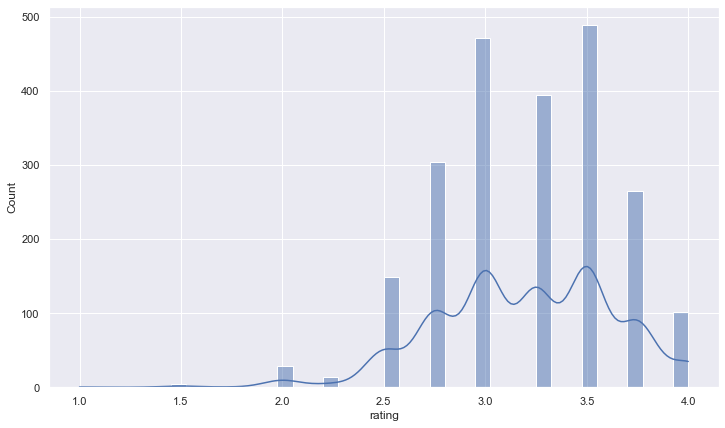

In [6]:
#Seaborn makes some nice looking plots overriding matplotlib's style
# However, it's good to save the original `matplotlib` style before 
# setting seaborn's to be able to restore it accurately after
orig_plt_params = plt.rcParams
sns.set()

#Plot a histogram for the ratings with a kernel density estimate
plt.figure(figsize=(12,7))
sns.histplot(data=chocolateratings_df, x="rating", kde=True)
plt.show()

This is the key for what these ratings mean:

- $4.0 - 5.00$ = Outstanding
- $3.5 - 3.90$ = Highly Recommended
- $3.0 - 3.49$ = Recommended
- $2.0 - 2.90$ = Disappointing
- $1.0 - 1.90$  = Unpleasant

## 4) Data Preparation

### 4.1) Set Random Seed (for Reproducibility)

In [7]:
#For reproducibility, it's imperative to consistently use a seed number and set it to NumPy, 
# tensorflow or in whatever place a stochastic process exists and allows for it to be set.
rand = 9
np.random.seed(rand)
os.environ['PYTHONHASHSEED']=str(rand)

### 4.2) Train/Test Split (Tabular)

In [8]:
#We define `y` as `rating` column converted to 1's if greater than or equal to 3.5 and 0 otherwise
y = chocolateratings_df['rating'].\
                            apply(lambda x: 1 if x >= 3.5 else 0)

#`X` is everything else (excluding `company` and `tastes`)
X = chocolateratings_df.drop(['rating','company','tastes'], axis=1).copy()

#Create `X` and `y` and split them 67/33 corresponding for train/test.
X_train, X_test, y_train, y_test = train_test_split(X, y,\
                                test_size=0.33, random_state=rand)

### 4.3) Train/Test Split (NLP)

In addition to the tabular test and train datasets, for our NLP models, we will need text-only feature datasets that are consistent with our `train_test_split` so we can use the same `y` labels. 

In [9]:
#We define the NLP version of the training data as the `tastes` column and 
# split according to the same train/test indexes
X_train_nlp = chocolateratings_df.loc[X_train.index, 'tastes']
X_test_nlp = chocolateratings_df.loc[X_test.index, 'tastes']

### 4.4) Encode NLP Dataset with TF-IDF

No machine learning model can ingest the data as text, so we need to turn it into a numerical format. In other words, vectorize it. There are many techniques to do this. In our case, we are not interested in the position of words in each phrase nor the semantics. However, we are interested in their relative occurrence. For these reasons, _Term Frequency Inverse Document Frequency_ (TF-IDF) is the ideal method because it's meant to evaluate how often a term (each word) appears in the document (each phrase). However, it's weighted according to its frequency in the entire corpus (all phrases). 

In [10]:
#We can easily vectorize our datasets using the TF-IDF method with Sci-kit Learn's `TfidfVectorizer`
vectorizer = TfidfVectorizer(lowercase=False)

#Fit-transform according to the larger train data and simply transform with the test data
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

To get an idea of what the TF-IDF score looks like, we can place all the feature names in one column of a data frame, and their respective scores for a single observation in another. 

In [11]:
#Note that, since the vectorizer produces a `scipy` sparse matrix, we have to convert it into numpy matrix
# with `todense()` and then a numpy array with `asarray()`. We can sort this data frame in descending order 
# by TD-IDF scores.
pd.DataFrame({'taste':vectorizer.get_feature_names(),\
              'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
    sort_values(by='tf-idf', ascending=False)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000
...,...,...
136,empty,0.000000
135,edge,0.000000
134,easy,0.000000
133,easter,0.000000


## 5) Modeling

### 5.1) Define Evaluation Function

In [12]:
def evaluate_class_mdl(fitted_model, X_train, X_test, y_train, y_test, plot=True):
    """Given a classification model, plots an ROC curve and outputs some predictive
    performance metrics. Then it returns the predictions.
    
    Keyword arguments:
    fitted_model -- a fitted classification model with a `predict` or `predict_proba` function
    X_train -- training features (pandas dataframe or array)
    X_test -- test features (pandas dataframe or array)
    y_train -- training labels (pandas dataframe or array)
    y_test -- test labels (pandas dataframe or array)
    plot -- whether to display ROC plot or not (boolean)
    """
    
    sns.set()
    y_train_pred = fitted_model.predict(X_train).squeeze()
    if len(np.unique(y_train_pred)) > 2:
        y_train_pred = np.where(y_train_pred > 0.5, 1, 0)
        y_test_prob = fitted_model.predict(X_test).squeeze()
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    else:   
        y_test_prob = fitted_model.predict_proba(X_test)[:,1]
        y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    roc_auc = metrics.roc_auc_score(y_test, y_test_prob)
    if plot:
        plt.figure(figsize = (12,12))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 12)
        fpr, tpr, _ = metrics.roc_curve(y_test, y_test_prob)
        plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
        plt.xlabel('False Positive Rate', fontsize = 14)
        plt.ylabel('True Positive Rate', fontsize = 14)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.legend(loc="lower right")
        plt.show()
    print('\tAccuracy_train:  %.4f\t\tAccuracy_test:   %.4f' %\
                        (metrics.accuracy_score(y_train, y_train_pred),\
                         metrics.accuracy_score(y_test, y_test_pred)))
    print('\tPrecision_test:  %.4f\t\tRecall_test:     %.4f' %\
                        (metrics.precision_score(y_test, y_test_pred),\
                         metrics.recall_score(y_test, y_test_pred)))
    print('\tROC-AUC_test:    %.4f\t\tF1_test:         %.4f\t\tMCC_test: %.4f' %\
                        (roc_auc,\
                         metrics.f1_score(y_test, y_test_pred),\
                         metrics.matthews_corrcoef(y_test, y_test_pred)))
    return y_train_pred, y_test_prob, y_test_pred

### 5.2) Train C-Support Vector Classification Model (on Tabular Dataset)

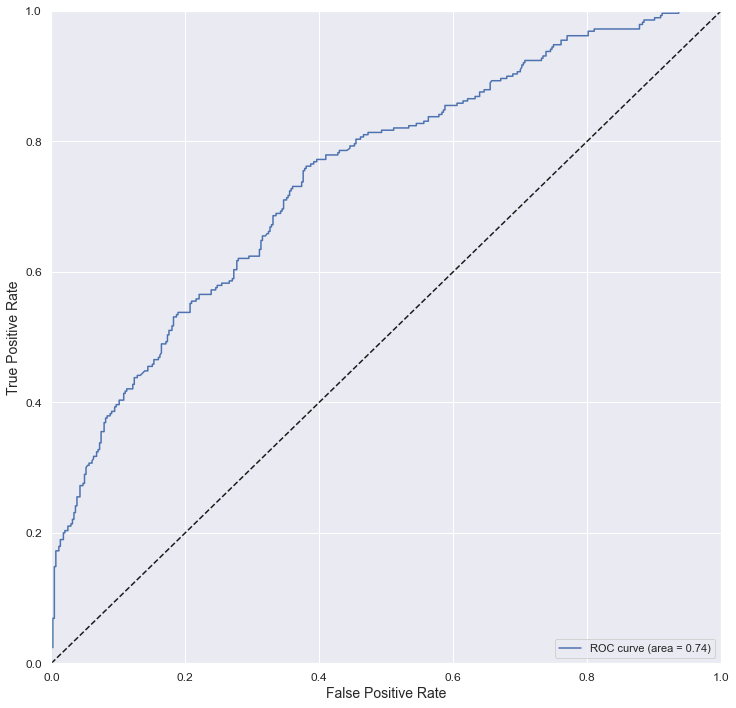

	Accuracy_train:  0.7315		Accuracy_test:   0.6989
	Precision_test:  0.6845		Recall_test:     0.4414
	ROC-AUC_test:    0.7450		F1_test:         0.5367		MCC_test: 0.3461


In [13]:
#Initialize the model
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)

#Fit the model
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)

#Evaluate the model with our custom function
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred =\
                                            evaluate_class_mdl(fitted_svm_mdl, X_train,\
                                                               X_test, y_train, y_test)

### 5.3) Train LightGBM Model (on NLP Dataset)

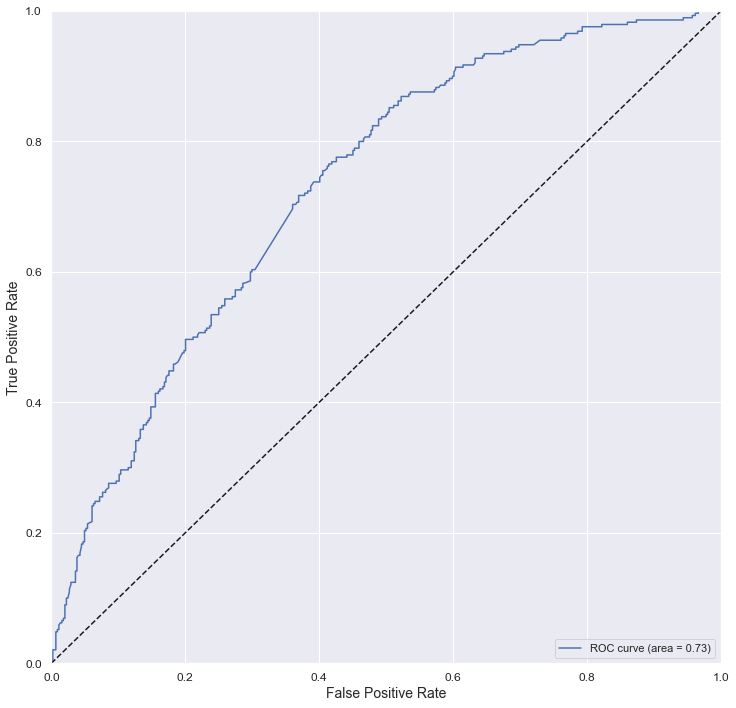

	Accuracy_train:  0.7980		Accuracy_test:   0.6744
	Precision_test:  0.6123		Recall_test:     0.4793
	ROC-AUC_test:    0.7300		F1_test:         0.5377		MCC_test: 0.2973


In [14]:
# import lightgbm as lgb
# rand = 9
#Initialize the model
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
                             n_estimators=100, objective='binary', random_state=rand)

#Fit the model
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)

#Evaluate the model with our custom function
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
                                            evaluate_class_mdl(fitted_lgb_mdl, X_train_nlp_fit,\
                                                               X_test_nlp_fit, y_train, y_test)

## 6) Global Intepretation with SHAP

First, initialize the explainer.

In [15]:
#KernelExplainer strongly suggests other measures to minimize computation. One of these is using `K-means` 
# to summarize the background training data instead of using it whole. Another method could be using a sample
# of the training data. In this case, we opted for k-means clustering into 10 centroids.
X_train_summary = shap.kmeans(X_train, 10)

#KernelExplainer takes a predict function for a model (`fitted_svm_mdl.predict_proba`) and
# some background training data (`X_train_summary`)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba,\
                                          X_train_summary)

Fit the explainer and display a summary.

  0%|          | 0/734 [00:00<?, ?it/s]

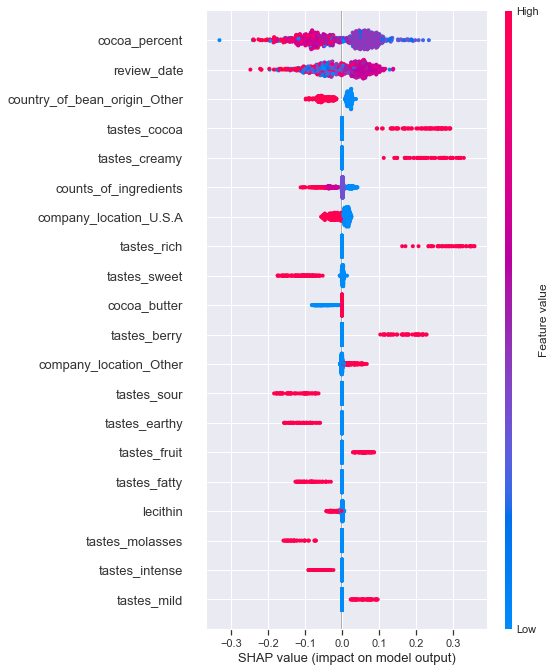

In [16]:
#Once we have initialized our explainer, we can use samples of our test dataset (`nsamples=200`) to come up 
# with the Shapely Values. It uses L1 regularization (`l1_reg`) during the fitting process.  What we are telling 
# it here is to regularize to the point it only has 20 relevant features.
shap_svm_values_test = shap_svm_explainer.shap_values(X_test,\
                                nsamples=200, l1_reg="num_features(20)")

#We can use a `summary_plot` to plot our Shapely Values for class `1`
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

We can tell that the highest (red) cocoa percentages (`cocoa_percent`) tend to correlate with a decrease in the likelihood of "Highly Recommend," but the middle percentages (purple) tend to increase it. This finding makes intuitive sense because the darkest chocolates are more of an acquired taste than less dark chocolates. The low values (blue) are scattered throughout, so they show no trend, but this could be because there aren't many.  On the other hand, `review date` suggests that it was likely to be "Highly Recommended" in the earlier years. Also that presence of tastes cocoa, creamy, rich and berry increases likelihood while sweet, earthy, sour, and fatty do the opposite. Likewise, if the chocolate was manufactured in the United States! Sorry, U.S.A. :/

## 7) Local Intepretation

### 7.1) Explore a Group of Points with SHAP Decision Plots

For local interpretation, you don't have to visualize one point at a time. You can interpret several at a time. The key is providing some context to compare the points adequately, and they can't be so many that you can't distinguish them. Usually, you would find outliers or only those that meet specific criteria. For this exercise, we will select only those bars that were produced by a specific French company:

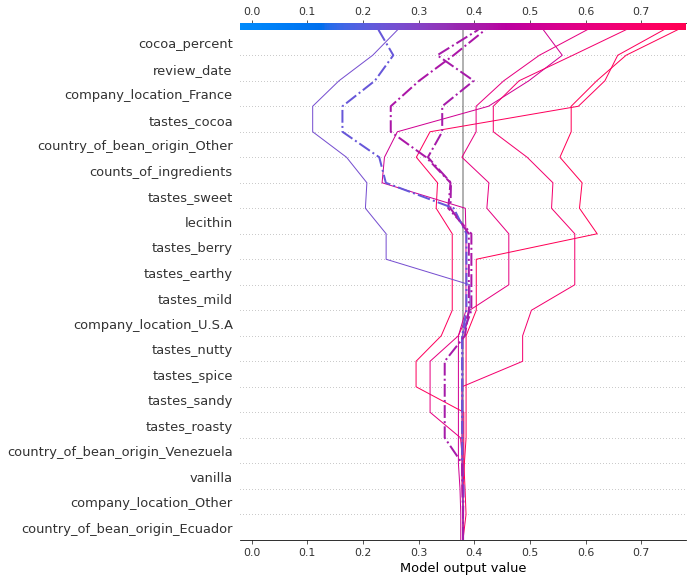

In [17]:
#Get indexes for a Group of Points
sample_test_idx = X_test.index.\
                    get_indexer_for([5,6,7,18,19,21,24,25,27])

#To highlight False Negatives from these points
FN = (y_test_svc_pred[sample_test_idx] == 0) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy() 

#Set the expected value for the positive class
expected_value = shap_svm_explainer.expected_value[1]

#Reset matplotlib style so that it's not seaborn's
sns.reset_orig()
plt.rcParams.update(orig_plt_params)

#Display decision plot with FN highlighted
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.iloc[sample_test_idx], highlight=FN)

You can tell that there are three false negatives plotted in. Using this plot, we can easily visualize what features made them veer towards the left the most because this is what made them negative predictions.  For instance, we know that the most leftmost false-negative (the dotted blue line) was to the right of the expected value line until `lecithin`, then continued decreasing till `company_location_France` and `review_date` increased its likelihood of "Highly Recommended" but it wasn't enough.  You can tell that `county_of_bean_origin_Other` decreased the likelihood of two of the misclassifications. This decision could be unfair because the country could be one of over 50 countries that didn't get their own feature. Quite possibly, there's a lot of variation between the beans of these countries grouped together.

### 7.2) Isolate a Single Decision with a SHAP Decision Plot

Let's plot one for one of the French chocolate bars:

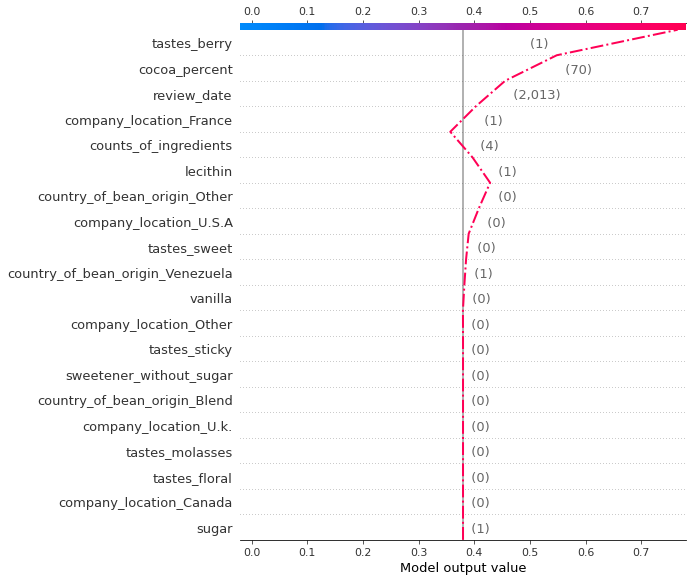

In [18]:
#Decision plot requires expected value as well as shap value and data for true positive observation #696
shap.decision_plot(expected_value, shap_svm_values_test[1][696],\
                   X_test.iloc[696], highlight=0)

You can see that `lecithin` and `counts_of_ingredients` decreased "Highly Recommended" likelihood to a point where it could have jeopardized it. Fortunately, all features above those veered the line decidedly rightward because `company_location_France=1`, `cocoa_percent=70`, and `tastes_berry=1` are all favorable.

### 7.3) Getting Aquainted with our "Instances of Interest"

The chocolate company that hired you has two bars they want you to compare. Bar #5 is _Outstanding_  and #24 is _Disappointing_. They are both in your test dataset. One way of comparing them is to place their values side by side in a data frame to understand how exactly they differ.

In [19]:
#Create boolean array with TRUE where the indexes are #5 and #24
eval_idxs = (X_test.index==5) | (X_test.index==24)

#Subset `X_test` by boolean array is TRUE
X_test_eval = X_test[eval_idxs]

#In a dataframe, we will concatenate the rating, the actual label `y`, and the predicted label `y_pred`
# to these observations' values
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()

#We can use color-coding to visualize where two chololate bars are different
eval_compare_df.style.\
        apply(lambda x: ['background: yellow' if (x[5] != x[24])\
                         else '' for i in x], axis=1)

,24,5
rating,2.750000,4.000000
y,0.000000,1.000000
y_pred,0.000000,1.000000
review_date,2015.000000,2013.000000
cocoa_percent,70.000000,70.000000
counts_of_ingredients,4.000000,4.000000
cocoa_butter,1.000000,1.000000
vanilla,0.000000,0.000000
lecithin,1.000000,1.000000
salt,0.000000,0.000000


We can examine the features to spot the differences. For instance, you can tell that _review_date_ are two years apart. Also, the beans for the _Outstanding_ bar were from Venezuela, and the _Disappointing_ one came from another lesser represented country. And the _Outstanding_ one had a berry taste, and the _Disappointing_ one was earthy.

### 7.4) Use SHAP's Force Plots to Explain "Instances of Interest"

The force plot can tell us a complete story of what weighed in the model's decisions and presumably the reviewers, and gives us clues to what consumers might prefer. To plot a `force_plot`, it requires the expected value for the class of your interest (`expected_value`), the SHAP values the observation of your interest, and this observation's actual values. 

In [20]:
#`force_plot` takes the `expected_value`, shap values for the instance in question, and
# datapoint for instance in question
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5],\
                X_test[X_test.index==5])

This force plot depicts how much `review_date`, `cocoa_percent` and `tastes_berry` weighs in the "Outstanding" prediction. While the only feature that seems to be weighing in the opposite direction is `counts_of_ingredients_`. 

In [21]:
#same as before but with all 5's replaced by 24
shap.initjs()
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24],\
                X_test[X_test.index==24])

We can easily tell that `tastes_earthy` and `country_of_bean_origin_Other` are considered highly negative attributes by our model. We could explain that outcome could be explained by mostly the difference in tasting "berry" versus "earthy". Despite our findings, the beans' origin country needs further investigation. After all, it is possible that the actual country of origin doesn't correlate with poor ratings. 

### 7.5) Explain "Instances of Interest" with LIME Tabular Explainer

First, initialize the explainer.

In [22]:
#To explain a single prediction, you first instantiate a `LimeTabularExplainer` by providing it with your sample
# dataset in NumPy 2d array (`X_test.values`), a list with the names of the features (`X_test.columns`), a list
# with the indices of the categorical features (only the first three features aren't categorical) and the class
# names. Another parameter that can greatly impact the local surrogate is `kernel_width`. It defines the diameter
# of the neighborhood, thus answering the question of what is considered local?
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,\
                        feature_names=X_test.columns, categorical_features=list(range(3,44)),\
                        class_names=['Not Highly Recomm.', 'Highly Recomm.'])

Fit the explainer to an instance and produce a summary for it.

In [23]:
#With the instantiated explainer, you can now use `explain_instance` to fit a local surrogate model to
# observation #5. We also will use our model's classifier function (`predict_proba`) and limit our number of
# features to eight (`num_features=8`). We can take the "explanation" returned and immediately visualize it 
# with `show_in_notebook`.
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

According to the local surrogate, `cocoa_percent` smaller or equal to $70$ is a favorable attribute plus the "berry" taste . Lack of sour, sweet and molasses tastes also weigh in favorably in this model. However, lack of rich, creamy, and cocoa tastes do not but not enough to push the scales towards "Not Highly Recommended".

In [24]:
#same as before but with all 5's replaced by 24
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

According to SHAP, knowing that `tastes_earthy=1` is what globally explains the disappointing nature of the #24 chocolate bar, this appears to be counterintuitive. So, what happened? It turns out that both observations #5 and #24 are relatively similar and, thus, in the same neighborhood. This neighborhood also includes many chocolate bars with "berry" tastes and very few with "earthy". However, there are not enough "earthy" ones to consider it a salient feature, so it attributes the difference between "Highly Recommended" and "Not Highly Recommended" to other features that seem to differentiate more often, at least locally.

### 7.5) Explain "Instances of Interest" with LIME NLP Explainer

First, initialize the explainer.

In [25]:
# Initializing a `LimeTextExplainer` is pretty simple. All parameters are optional, but it's recommended to 
# specify names for your classes. Just like with `LimeTabularExplainer`,  optional parameter `kernel_width`
# can be a critical because it defines the neighborhood's size, and there's a default which may not be optimal. 
# But it can be tuned on an instance-by-instance basis. 
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

Unlike Tabular Explainer, we must use a pipeline for the Text Explainer to transform text to vectors before we make predictions so this must be initialized too.

In [26]:
#With Scikit-learn's `make_pipeline` function, you can define a sequence of estimators that transform the data
# followed by one that can fit it. In this case, we just need `vectorizer` to transform our data, followed by
# our LightGBM model (`lgb_mdl`) that takes the transformed data.
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

Fit the explainer to an instance and produce a summary for it.

In [27]:
#Explaining an instance with `LimeTextExplainer` is similar to doing it for  `LimeTabularExplainer`. The 
# difference is we are using a pipeline (`lgb_pipeline`), and the data we are providing (first parameter) is 
# text since the pipeline can transform it for us.  
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

According to the LIME text explainer, the LightGBM model predicts "Highly Recommended" for observation #5 because of the word caramel. At least according to the local neighborhood, "raspberry" is not a factor.

In [28]:
#same as before but with all 5's replaced by 24
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

You can tell that observation #24 which is described to taste "burnt wood earthy choco" is "Not Highly Recommended" because of the words "earthy" and "burnt".

### 7.6) **BONUS**: Having Fun with Arbitrary Phrases with LIME NLP Explainer!

Given that we are using a pipeline that can vectorize any arbitrary text, let's have some fun with that! We will first try a phrase made out of adjectives we suspect that our model favors, then try one with unfavorable adjectives and lastly try using words that our model shouldn't be familiar with.

In [29]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

The explanations are spot-on for "creamy rich complex fruity" and "sour bitter roasty molasses" since model knows these words to be either very favorable or unfavorable. These words are also common enough to be appreciated on a local level. However, you'ld be mistaken to think that the prediction of "Not Highly Recommended" for "nasty disgusting gross stuff" has anything to do with the words. The LightGBM model hasn't seen these words before so the prediction has more to do with "Not Highly Recommended" being the majority class, which is a good guess. And the sparse matrix for this phrase is all zeroes. Therefore, LIME likely found a few distant points, if any at all, in its neighborhood, so the zero coefficients of LIME's local surrogate model reflect this.

### 7.7) **BONUS**: Attempting SHAP KernelExplainer for NLP Model 

First, there are two technical hurdles to overcome. 

1. KernelExplainer is compatible with a pipeline, but it expects a single set of predictions back. But LightGBM returns two sets, one for each class: "Not Highly Recommended" and "Highly Recommended". To overcome this problem, we can create a lambda function that includes a `predict_proba` function, which returns only those predictions for "Highly Recommended".

2. SHAP's incompatibility with Scipy's sparse matrices. And for our explainer, we will need sample vectorized test data, which is in this format. To overcome this issue, can convert our data in Scipy sparse matrix format to a NumPy matrix  and then to a Pandas data frame (`X_test_nlp_samp_df`).

In [30]:
#Create a lambda predict function
predict_fn = lambda X: lgb_mdl.predict_proba(X)[:,1]

#Place sample in dataframe
X_test_nlp_samp_df = pd.DataFrame(shap.sample(X_test_nlp_fit, 50).todense())

Then, initialize the explainer.

In [31]:
#To overcome the slowness, we can use the same `kmeans` trick we used last time. Other than the adjustments made 
# to overcome obstacles, the following code is exactly the same as with SHAP performed with the SVM model.
shap_lgb_explainer = shap.KernelExplainer(predict_fn,\
                            shap.kmeans(X_train_nlp_fit.todense(), 10))
shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,\
                                            l1_reg="num_features(20)")

  0%|          | 0/50 [00:00<?, ?it/s]

Let's try two examples from these sample SHAP values:

In [32]:
print(shap.sample(X_test_nlp, 50).to_list()[18])
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[18,:], 
                X_test_nlp_samp_df.iloc[18,:], feature_names=vectorizer.get_feature_names())

woody earthy medicinal


As you can tell, "earthy" and "woody" weigh heavily in a prediction against "Highly Recommended". The word "medicinal" is not featured in the force plot and instead you get a lack of "creamy" and "cocoa" as negative factors. As you can imagine, "medicinal" is not a word used often to describe chocolate bars so there was only one observation in the sampled dataset that included it. Therefore it's average marginal contribution across possible coalitions would be greatly diminished.

In [33]:
print(shap.sample(X_test_nlp, 50).to_list()[9])
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[9,:], 
                X_test_nlp_samp_df.iloc[9,:], feature_names=vectorizer.get_feature_names())

intense spicy floral


All words in the phrase are featured in the force plot: "floral" and "spicy" pushing towards "Highly Recommended" and "intense" towards "Not Highly Recommended":

## 8) Learn More 

### 8.0) Credits: Serg Masis

### 8.1) Relevant External Documentation

- [SHAP: KernelExplainer](https://shap.readthedocs.io/en/latest/generated/shap.KernelExplainer.html)
- [LIME: TabularExplainer](https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_tabular)
- [LIME: TextExplainer](https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_text)

### 8.2) Other Python Code Examples

- [SHAP Official Notebooks — all explainers](https://github.com/slundberg/shap/tree/master/notebooks)
- [LIME Official Notebooks — all explainers](https://github.com/marcotcr/lime/tree/master/doc/notebooks)
- [ODSC West Recidivism Fairness Example](https://serg.ai/odsc2020/)

### 8.3) Interpretable ML Books / Blogs

- [Molnar, Christoph. (2019). Interpretable machine learning. A Guide for Making Black Box Models Explainable](https://christophm.github.io/interpretable-ml-book/) ~ Book with code examples in R
- [Samek, Wojciech et al. (2019). Explainable AI: Interpreting, Explaining and Visualizing Deep Learning, Springer](https://www.springer.com/gp/book/9783030289539) ~ Book with no code examples
- [Sarkar, DJ. (2018). Explainable AI. Towards Data Science](https://towardsdatascience.com/human-interpretable-machine-learning-part-1-the-need-and-importance-of-model-interpretation-2ed758f5f476) ~ Blog thread with python code examples

### 8.4) Relevant Theory to this Session

- [Lundberg, S., & Lee, S. (2017). A Unified Approach to Interpreting Model Predictions. Advances in Neural Information Processing Systems, 30.](https://arxiv.org/abs/1705.0787)
- [Ribeiro, M.T., Singh, S., & Guestrin, C. (2016). "Why Should I Trust You?": Explaining the Predictions of Any Classifier. Proceedings of the 22nd ACM SIGKDD International Conference on Knowledge Discovery and Data Mining](https://arxiv.org/abs/1602.04938)
- [Štrumbelj, E., & Kononenko, I. (2014). Explaining prediction models and individual predictions with feature contributions. Knowledge and Information Systems, 41, 647-665.](https://doi.org/10.1007/s10115-013-0679-x)
- [Lipovetsky, S., & Conklin, M. (2001). Analysis of regression in game theory approach. Applied Stochastic Models in Business and Industry, 17.4, 319-330.](https://doi.org/10.1002/asmb.446)
- [Shapley, Lloyd S. (1953). "A Value for n-person Games". In Kuhn, H. W.; Tucker, A. W. (eds.). Contributions to the Theory of Games. Annals of Mathematical Studies. 28. Princeton University Press. pp. 307–317.](https://doi.org/10.1515/9781400881970-018)